## Short time Fourier transform Implementation 

In [96]:
#imports 
import numpy as np 
import matplotlib.pyplot as plt 
import IPython.display as ipd
import librosa 
import librosa.display
#libraries used 

### Data preparation and loading 

In [97]:
ipd.Audio("Track001.wav")

In [98]:
ipd.Audio("Track002.wav")

In [99]:
ipd.Audio("Track003.wav")

In [100]:
ipd.Audio("Track004.wav")

In [101]:
FRAME_SIZE=2048 #powers of two , for reasons like spectral leakage 
HOP_SIZE=512 #same , powers of 2


In [102]:
#loading the tracks 
x,sr= librosa.load("Track001.wav")
y=librosa.load("Track002.wav")
z=librosa.load("Track003.wav")
a=librosa.load("Track004.wav")


### STFT

In [103]:
#taking the stft of the tracks 
x_scale=librosa.stft(x,n_fft=FRAME_SIZE,hop_length=HOP_SIZE)
x.shape #242550
y_scale=librosa.stft(x,n_fft=FRAME_SIZE,hop_length=HOP_SIZE)
y_scale.shape #242550
z_scale=librosa.stft(x,n_fft=FRAME_SIZE,hop_length=HOP_SIZE)
z_scale.shape #242550
a_scale=librosa.stft(x,n_fft=FRAME_SIZE,hop_length=HOP_SIZE)
a_scale.shape #242550

(1025, 474)

In [104]:
#shape and size and type check 
x_scale.shape # shape will be (#frequency bins , #time bins ) freq = framesize/2 +1. time = 242550-2048/51

(1025, 474)

In [105]:
type(x_scale[0][0]) #type complex xoefficients 

numpy.complex64

### VIsualising the STFT

In [106]:
#finding the abs value to plot a spectogram 
x_spec= abs(x_scale)**2
y_spec= abs(y_scale)**2
z_spec= abs(z_scale)**2
a_spec= abs(a_scale)**2

x_spec.shape #same as before
type(x_spec[0][0]) #float 

numpy.float32

In [107]:
#spectogram plot definition 
def plot_spectogram(data,sr,hop_length, y_axis="linear"):
    plt.figure(figsize=(25,10))
    librosa.display.specshow(data,y_axis=y_axis,x_axis="time",hop_length=hop_length, sr=sr)
    plt.colorbar(format="%+2.f")

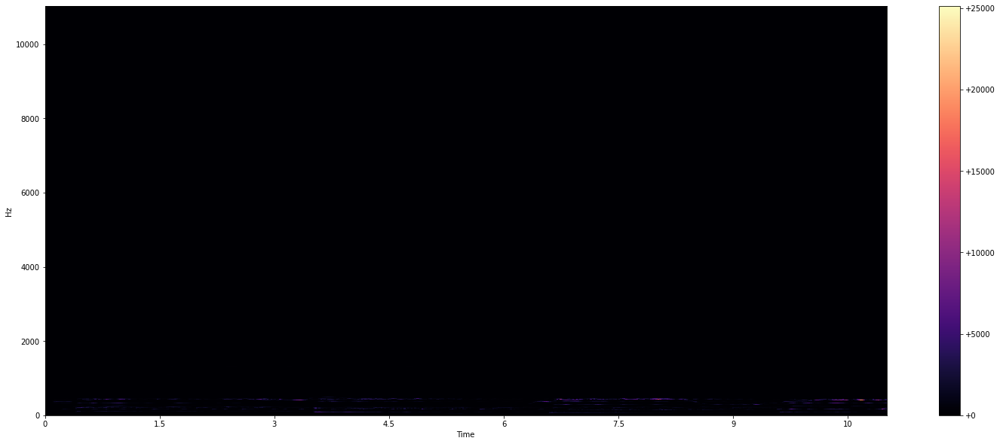

In [108]:
plot_spectogram(x_spec,sr,HOP_SIZE)

### Log conversion 

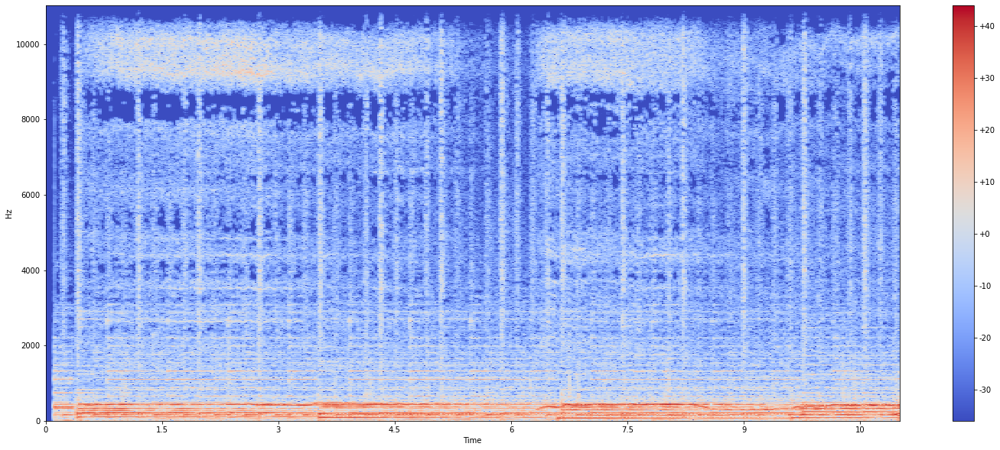

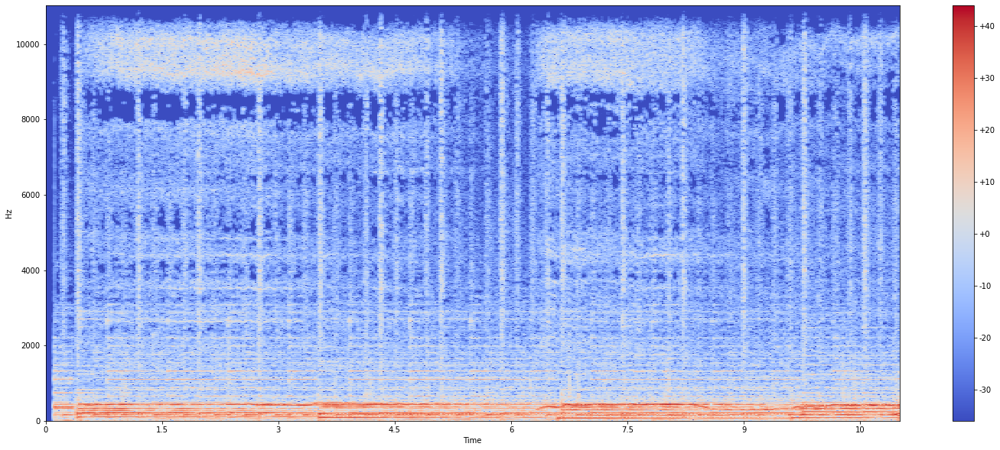

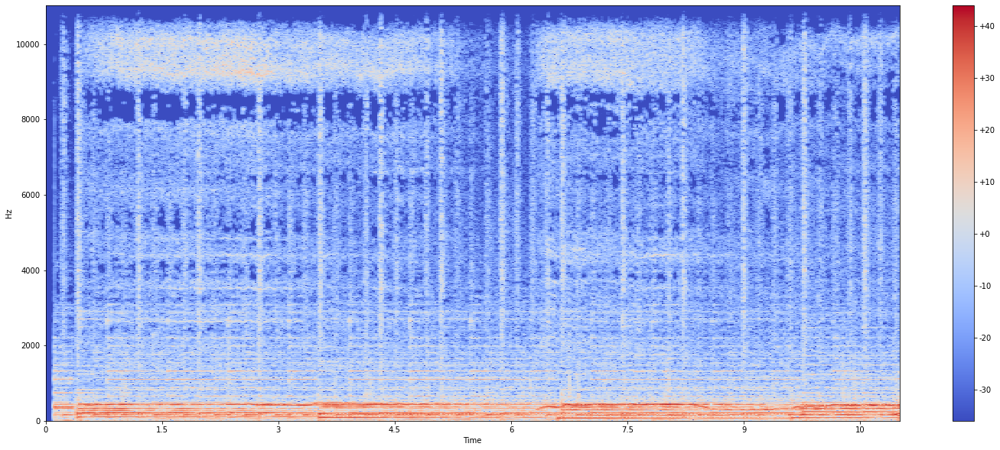

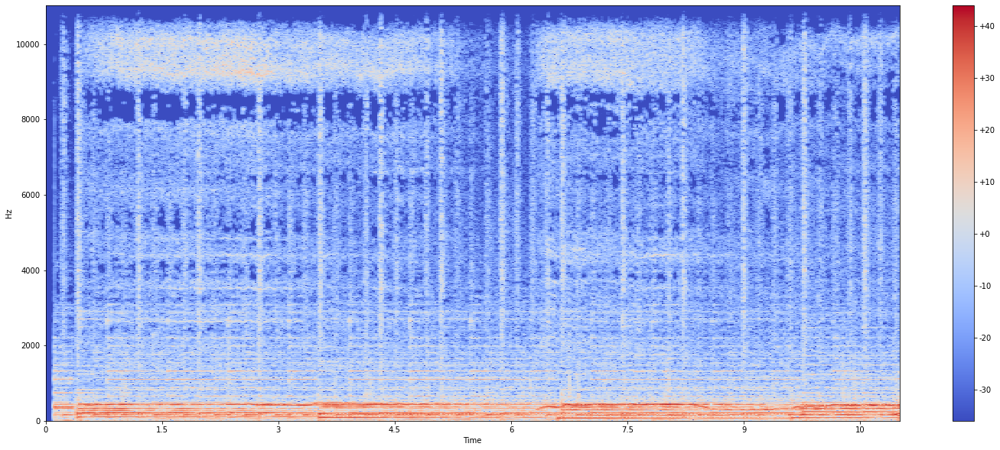

In [109]:
#converting to log scale, for begtre visualisation 
x_log_spec=librosa.power_to_db(x_spec)
y_log_spec=librosa.power_to_db(y_spec)
z_log_spec=librosa.power_to_db(z_spec)
a_log_spec=librosa.power_to_db(a_spec)

plot_spectogram(x_log_spec,sr,HOP_SIZE)
plot_spectogram(y_log_spec,sr,HOP_SIZE)
plot_spectogram(z_log_spec,sr,HOP_SIZE)
plot_spectogram(a_log_spec,sr,HOP_SIZE)

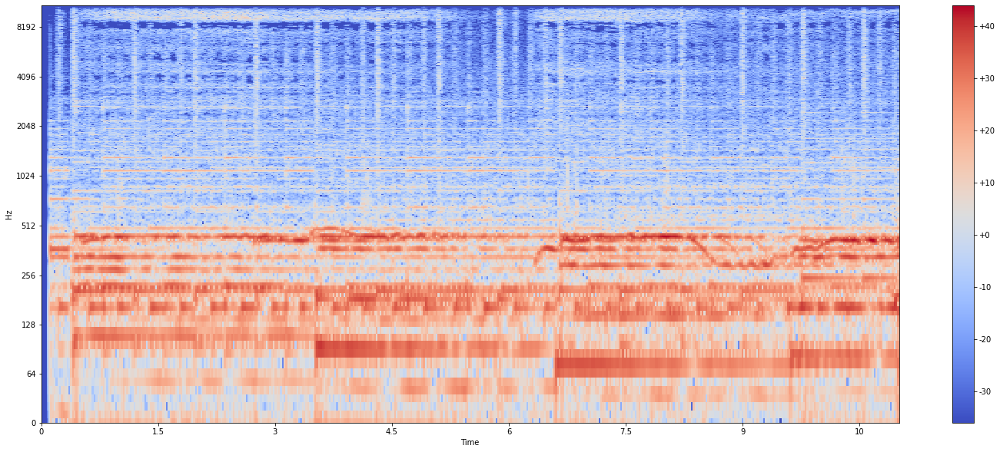

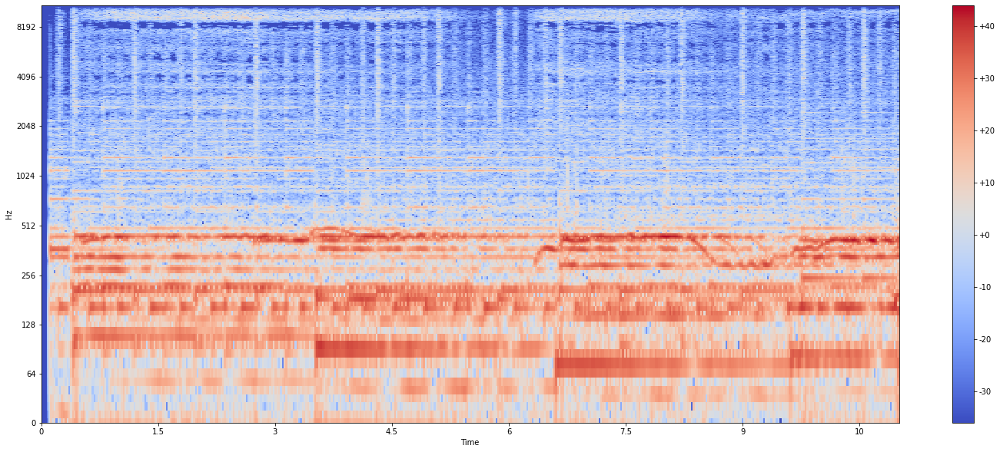

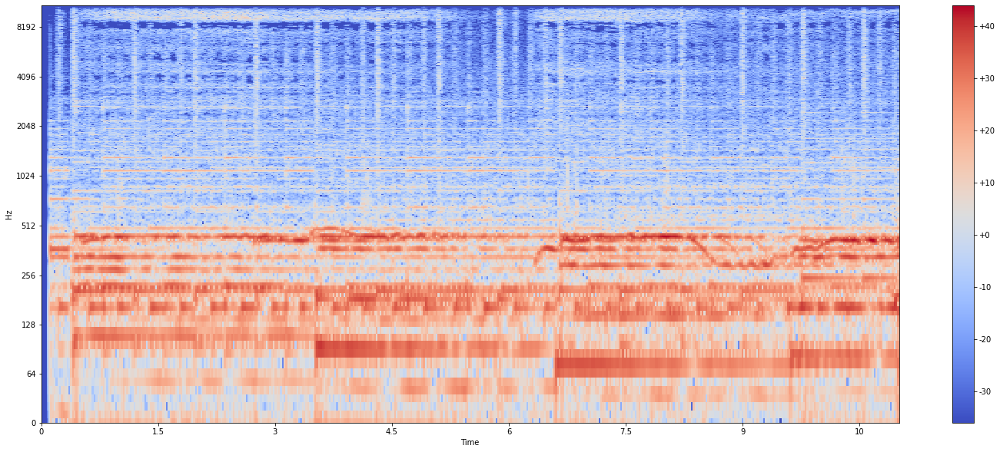

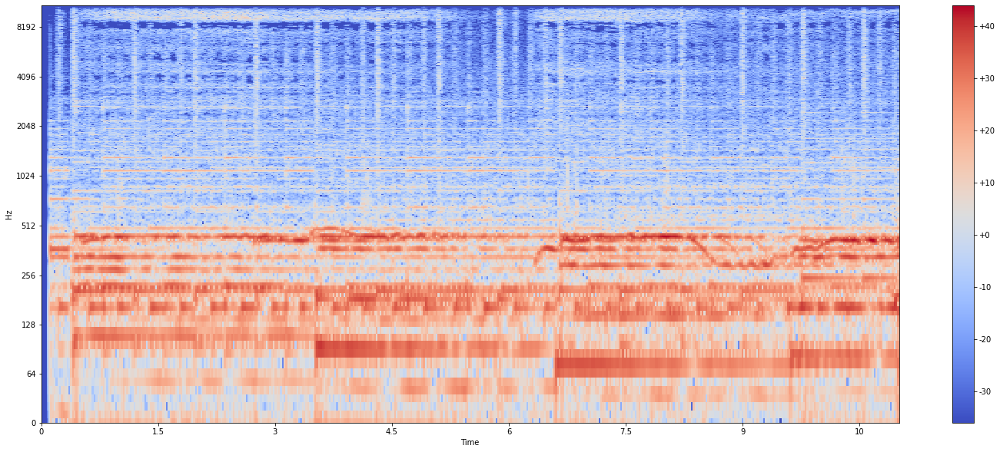

In [110]:
plot_spectogram(x_log_spec,sr,HOP_SIZE,y_axis="log")
plot_spectogram(y_log_spec,sr,HOP_SIZE,y_axis="log")
plot_spectogram(z_log_spec,sr,HOP_SIZE,y_axis="log")
plot_spectogram(a_log_spec,sr,HOP_SIZE,y_axis="log")